In [1]:
!pip install ultralytics opencv-python torch torchvision roboflow
from roboflow import Roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.0/950.0 kB 18.2 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.5/84.5 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 86.1 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-decision-forests 1.10.0 requires tensorflow==2.17.0, but you have tensorflow 2.17.1 which is incompatible.


In [2]:
from ultralytics import YOLO
model = YOLO("yolov8m.pt")  # Use YOLOv8 Nano for speed; replace with "yolov8m.pt" for more accuracy.

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 49.7M/49.7M [00:00<00:00, 239MB/s]


In [3]:
model.train(
    data="/kaggle/input/tt100-4/data.yaml",  # Use absolute path
    epochs=50,
    batch=24,
    imgsz=640,
    lr0=0.001,
    optimizer="Adam",
    workers=4,
    device=0
)

Ultralytics 8.3.98 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/kaggle/input/tt100-4/data.yaml, epochs=50, time=None, patience=100, batch=24, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=4, project=None, name=train, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_box

100%|██████████| 755k/755k [00:00<00:00, 17.9MB/s]


Overriding model.yaml nc=80 with nc=151

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralyti

100%|██████████| 5.35M/5.35M [00:00<00:00, 73.4MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/input/tt100-4/train/labels... 16482 images, 499 backgrounds, 0 corrupt: 100%|██████████| 16482/16482 [00:48<00:00, 343.26it/s]


train: WARNING ⚠️ Cache directory /kaggle/input/tt100-4/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


A new version of Albumentations is available: 2.0.5 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
val: Scanning /kaggle/input/tt100-4/valid/labels... 609 images, 0 backgrounds, 0 corrupt: 100%|██████████| 609/609 [00:02<00:00, 273.78it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/tt100-4/valid is not writeable, cache not saved.


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: Adam(lr=0.001, momentum=0.937) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005625000000000001), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      9.58G      1.203      2.521     0.8599         79        640: 100%|██████████| 687/687 [09:19<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:10<00:00,  1.22it/s]

                   all        609       1615      0.559      0.217      0.198      0.139



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      11.8G      1.115      1.762      0.849         73        640: 100%|██████████| 687/687 [09:12<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.46it/s]

                   all        609       1615      0.551      0.233      0.249      0.175



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      11.8G      1.125      1.653     0.8492         56        640: 100%|██████████| 687/687 [09:10<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.47it/s]

                   all        609       1615      0.587      0.238      0.321      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      11.8G      1.072        1.5     0.8437         71        640: 100%|██████████| 687/687 [09:08<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.47it/s]

                   all        609       1615      0.543      0.339      0.363      0.267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      11.8G       1.04      1.391     0.8385         70        640: 100%|██████████| 687/687 [09:08<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.47it/s]

                   all        609       1615      0.525      0.371      0.399      0.302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      11.8G      1.019      1.314     0.8367         49        640: 100%|██████████| 687/687 [09:08<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.47it/s]

                   all        609       1615      0.608      0.364      0.465      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      11.8G          1      1.238     0.8335         87        640: 100%|██████████| 687/687 [09:08<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.47it/s]

                   all        609       1615      0.692      0.378      0.452      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      11.8G     0.9967      1.202     0.8326         68        640: 100%|██████████| 687/687 [09:08<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.47it/s]

                   all        609       1615      0.673      0.362      0.484      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      11.8G     0.9863      1.146     0.8293         57        640: 100%|██████████| 687/687 [09:08<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.47it/s]

                   all        609       1615      0.676      0.412      0.481       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      11.8G     0.9821      1.124     0.8302         65        640: 100%|██████████| 687/687 [09:08<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.47it/s]

                   all        609       1615      0.605      0.499      0.539      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      11.8G     0.9654       1.08     0.8275         74        640: 100%|██████████| 687/687 [09:08<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.47it/s]

                   all        609       1615      0.645      0.473      0.554      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      11.8G     0.9531      1.055     0.8255         82        640: 100%|██████████| 687/687 [09:07<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.48it/s]

                   all        609       1615      0.723      0.423      0.547      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      11.8G     0.9492      1.022     0.8258         51        640: 100%|██████████| 687/687 [09:08<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.47it/s]

                   all        609       1615      0.632      0.489      0.529      0.413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      11.8G     0.9417     0.9943     0.8257         56        640: 100%|██████████| 687/687 [09:07<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.47it/s]

                   all        609       1615      0.672      0.455      0.566      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      11.8G     0.9336     0.9676     0.8203         47        640: 100%|██████████| 687/687 [09:07<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.47it/s]

                   all        609       1615      0.661      0.487      0.582      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      11.8G     0.9296      0.962     0.8206         45        640: 100%|██████████| 687/687 [09:08<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.48it/s]

                   all        609       1615      0.638      0.525      0.559      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      11.8G     0.9304      0.947     0.8231         60        640: 100%|██████████| 687/687 [09:08<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.47it/s]

                   all        609       1615      0.689      0.473      0.585      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      11.8G     0.9184     0.9141     0.8202         61        640: 100%|██████████| 687/687 [09:07<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.48it/s]

                   all        609       1615      0.714      0.506      0.594      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      11.8G     0.9148     0.8986     0.8188        103        640: 100%|██████████| 687/687 [09:08<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.47it/s]

                   all        609       1615      0.704       0.53       0.61      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      11.8G     0.9068     0.8859     0.8189         54        640: 100%|██████████| 687/687 [09:07<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.47it/s]

                   all        609       1615      0.707      0.518      0.585      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      11.8G     0.9042     0.8732     0.8193         31        640: 100%|██████████| 687/687 [09:08<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.47it/s]

                   all        609       1615      0.787      0.503      0.616       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      11.8G     0.9021      0.858     0.8185         64        640: 100%|██████████| 687/687 [09:07<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.48it/s]

                   all        609       1615      0.713      0.569      0.625        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      11.8G     0.9026     0.8497      0.818         43        640: 100%|██████████| 687/687 [09:08<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.47it/s]

                   all        609       1615      0.677      0.579      0.632      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      11.8G     0.8928     0.8388     0.8185         75        640: 100%|██████████| 687/687 [09:08<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.47it/s]

                   all        609       1615      0.736      0.532      0.637      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      11.8G       0.88     0.7973     0.8173         58        640: 100%|██████████| 687/687 [09:08<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.47it/s]

                   all        609       1615      0.739      0.563      0.653      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      11.8G     0.8807      0.798      0.816         70        640: 100%|██████████| 687/687 [09:07<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.48it/s]

                   all        609       1615       0.71      0.571      0.649      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      11.8G     0.8856     0.7889     0.8158         65        640: 100%|██████████| 687/687 [09:07<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.48it/s]

                   all        609       1615      0.766      0.548      0.647      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      11.8G     0.8734     0.7769     0.8169         58        640: 100%|██████████| 687/687 [09:08<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.48it/s]

                   all        609       1615      0.783      0.546      0.671      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      11.8G     0.8685     0.7636     0.8133         51        640: 100%|██████████| 687/687 [09:08<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.47it/s]

                   all        609       1615      0.706      0.584      0.661      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      11.8G     0.8632     0.7503     0.8139         40        640: 100%|██████████| 687/687 [09:07<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.47it/s]

                   all        609       1615       0.77      0.581      0.688       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      11.8G     0.8621     0.7334     0.8124        103        640: 100%|██████████| 687/687 [09:07<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.48it/s]

                   all        609       1615      0.804      0.554       0.68      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      11.8G     0.8489     0.7233     0.8134         71        640: 100%|██████████| 687/687 [09:07<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.47it/s]

                   all        609       1615      0.697      0.607      0.673      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      11.8G     0.8496     0.7017     0.8115         50        640: 100%|██████████| 687/687 [09:07<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.48it/s]

                   all        609       1615      0.805      0.557      0.676      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      11.8G     0.8438     0.6943     0.8109         73        640: 100%|██████████| 687/687 [09:08<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.47it/s]

                   all        609       1615      0.779      0.578       0.69      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      11.8G     0.8358     0.6707     0.8104         51        640: 100%|██████████| 687/687 [09:08<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.48it/s]

                   all        609       1615      0.826      0.574      0.685      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      11.8G     0.8299     0.6702     0.8089         63        640: 100%|██████████| 687/687 [09:07<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.47it/s]

                   all        609       1615      0.842      0.559       0.68      0.544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      11.8G     0.8279     0.6575     0.8088         68        640: 100%|██████████| 687/687 [09:07<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.47it/s]

                   all        609       1615      0.794      0.589      0.678      0.544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      11.8G     0.8254      0.645     0.8092         56        640: 100%|██████████| 687/687 [09:07<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.47it/s]

                   all        609       1615      0.817      0.572      0.692      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      11.8G     0.8208     0.6344      0.809         64        640: 100%|██████████| 687/687 [09:08<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.48it/s]

                   all        609       1615      0.819      0.562      0.701       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      11.8G     0.8141     0.6215     0.8081         53        640: 100%|██████████| 687/687 [09:08<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.48it/s]

                   all        609       1615      0.795      0.579      0.693      0.551


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      11.8G      0.804     0.5644     0.8085         36        640: 100%|██████████| 687/687 [09:07<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.46it/s]

                   all        609       1615        0.8      0.566      0.673       0.54



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      11.8G     0.7931     0.5511     0.8056         48        640: 100%|██████████| 687/687 [09:06<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.48it/s]

                   all        609       1615      0.815      0.573      0.691      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      11.8G     0.7894     0.5376     0.8068         47        640: 100%|██████████| 687/687 [09:06<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.48it/s]

                   all        609       1615      0.813      0.585      0.691      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      11.8G     0.7833     0.5283      0.806         39        640: 100%|██████████| 687/687 [09:06<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.47it/s]

                   all        609       1615       0.76      0.614      0.694      0.552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      11.8G     0.7779     0.5161     0.8051         46        640: 100%|██████████| 687/687 [09:06<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.48it/s]

                   all        609       1615       0.76      0.604      0.685      0.549



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      11.8G     0.7679     0.5027     0.8045         29        640: 100%|██████████| 687/687 [09:06<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.48it/s]

                   all        609       1615      0.838       0.57      0.684      0.549



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      11.8G     0.7638     0.4955     0.8032         44        640: 100%|██████████| 687/687 [09:07<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.47it/s]

                   all        609       1615      0.818      0.577      0.686       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      11.8G     0.7617     0.4872     0.8036         43        640: 100%|██████████| 687/687 [09:06<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.48it/s]

                   all        609       1615      0.813      0.585      0.689       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      11.8G     0.7585      0.478     0.8021         44        640: 100%|██████████| 687/687 [09:06<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.48it/s]

                   all        609       1615      0.831      0.583       0.69      0.548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      11.8G     0.7505     0.4679     0.8003         41        640: 100%|██████████| 687/687 [09:06<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:08<00:00,  1.47it/s]

                   all        609       1615      0.794      0.597      0.689      0.549



50 epochs completed in 7.752 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 52.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 52.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.98 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 92 layers, 25,927,189 parameters, 0 gradients, 79.2 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:09<00:00,  1.44it/s]


                   all        609       1615      0.819      0.562      0.701       0.56
                 10020          2          2          1          0      0.995      0.895
                 10123         34         36      0.844      0.667      0.767      0.524
                 10139         44         49      0.812      0.706      0.789      0.594
                 10141        115        124      0.939      0.742      0.902      0.616
                 10150          8          8      0.944          1      0.995      0.873
                 10239         15         19      0.982          1      0.995      0.796
                 10247         10         11      0.732          1       0.94      0.809
                 10251          3          3          1      0.756      0.995      0.913
                 10254         40         60      0.905        0.7      0.824      0.606
                 10274         28         29      0.854      0.608      0.787      0.459
                 1028

invalid value encountered in less
invalid value encountered in less


Speed: 0.2ms preprocess, 10.2ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([  1,   6,   8,   9,  10,  13,  15,  16,  17,  18,  19,  20,  21,  22,  24,  26,  27,  28,  29,  30,  33,  34,  36,  37,  38,  40,  42,  43,  44,  45,  46,  48,  49,  51,  52,  55,  61,  64,  67,  69,  71,  72,  73,  74,  75,  76,  77,  78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  89,  90,  91,  92,  97,
        99, 100, 101, 103, 104, 105, 106, 107, 108, 109, 111, 112, 114, 119, 122, 127, 129, 130, 141, 142, 143, 144, 145, 148])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f01f2ade5c0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.0160

In [4]:
# Evaluate the fine-tuned model
metrics = model.val(data="/kaggle/input/tt100-4/data.yaml")  # Path to data.yaml
print(metrics)  # Display mAP, precision, recall, etc.

Ultralytics 8.3.98 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 92 layers, 25,927,189 parameters, 0 gradients, 79.2 GFLOPs


val: Scanning /kaggle/input/tt100-4/valid/labels... 609 images, 0 backgrounds, 0 corrupt: 100%|██████████| 609/609 [00:00<00:00, 619.52it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/tt100-4/valid is not writeable, cache not saved.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:17<00:00,  1.48it/s]


                   all        609       1615      0.819      0.562      0.701      0.559
                 10020          2          2          1          0      0.995      0.895
                 10123         34         36      0.843      0.667      0.768      0.535
                 10139         44         49      0.812      0.707       0.79      0.593
                 10141        115        124      0.939      0.742      0.902       0.62
                 10150          8          8      0.944          1      0.995      0.866
                 10239         15         19      0.982          1      0.995      0.797
                 10247         10         11      0.731          1       0.94      0.802
                 10251          3          3          1      0.756      0.995      0.913
                 10254         40         60      0.905        0.7      0.824      0.609
                 10274         28         29      0.855      0.608      0.788      0.452
                 1028

invalid value encountered in less
invalid value encountered in less


Speed: 0.9ms preprocess, 23.7ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to runs/detect/train2
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([  1,   6,   8,   9,  10,  13,  15,  16,  17,  18,  19,  20,  21,  22,  24,  26,  27,  28,  29,  30,  33,  34,  36,  37,  38,  40,  42,  43,  44,  45,  46,  48,  49,  51,  52,  55,  61,  64,  67,  69,  71,  72,  73,  74,  75,  76,  77,  78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  89,  90,  91,  92,  97,
        99, 100, 101, 103, 104, 105, 106, 107, 108, 109, 111, 112, 114, 119, 122, 127, 129, 130, 141, 142, 143, 144, 145, 148])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f01ee7acf40>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.00

In [5]:
model = YOLO("runs/detect/train/weights/best.pt")


image 1/15 /kaggle/input/test-images/test_images/1068_jpg.rf.3e43167e852984dd3a4ab4bde757679e.jpg: 640x640 1 1125, 37.4ms
image 2/15 /kaggle/input/test-images/test_images/1145_jpg.rf.141de8203850e649701ba3a8a6722d16.jpg: 640x640 1 10313, 1 11264, 2 11536s, 35.9ms
image 3/15 /kaggle/input/test-images/test_images/1294_jpg.rf.c11502d9d933d271b4dd2b2482a6f6b6.jpg: 640x640 1 11264, 1 11536, 1 12182, 35.9ms
image 4/15 /kaggle/input/test-images/test_images/1330_jpg.rf.f724e4897252f4242222b450df742dd5.jpg: 640x640 1 11241, 35.8ms
image 5/15 /kaggle/input/test-images/test_images/1378_jpg.rf.549748635b7c7c4ee66e3c9f27d85e0c.jpg: 640x640 1 11264, 35.9ms
image 6/15 /kaggle/input/test-images/test_images/1404_jpg.rf.59c46597746bb5af9657effe581dbc17.jpg: 640x640 1 10286, 1 1125, 1 11275, 1 11536, 22.7ms
image 7/15 /kaggle/input/test-images/test_images/1567_jpg.rf.26973cc5f0c7a7bc6d06e63424dfd6c8.jpg: 640x640 (no detections), 22.6ms
image 8/15 /kaggle/input/test-images/test_images/165_jpg.rf.d82e7b43

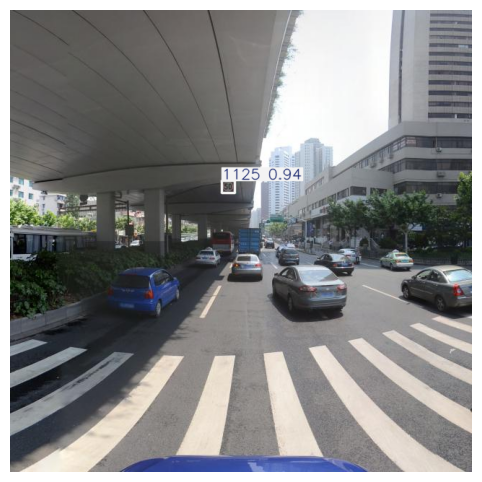

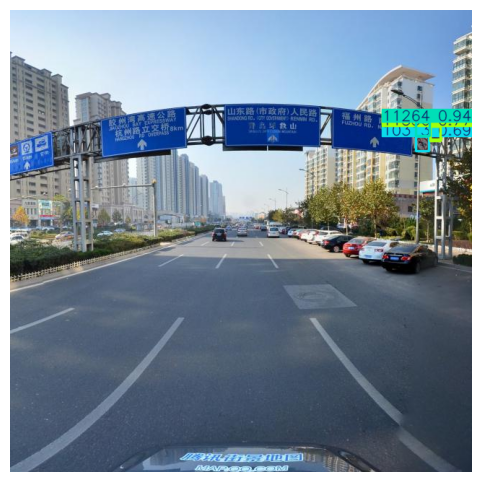

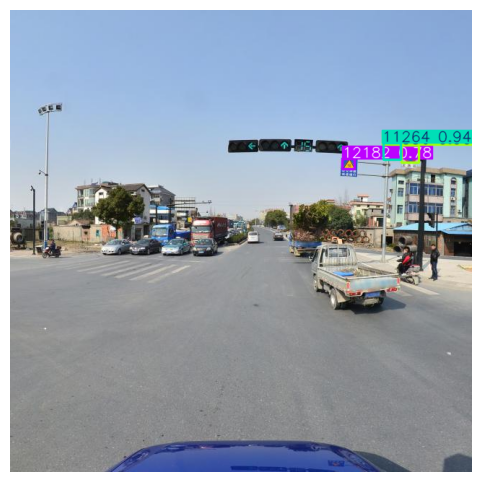

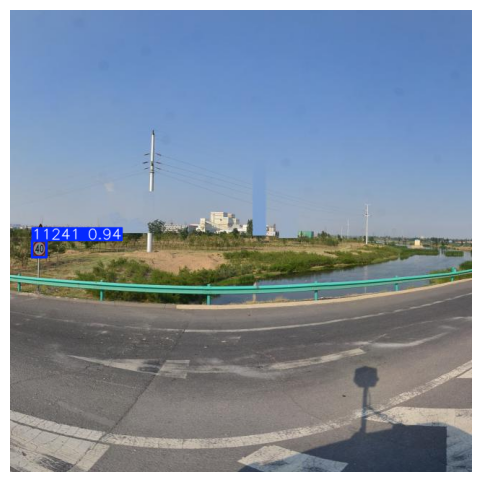

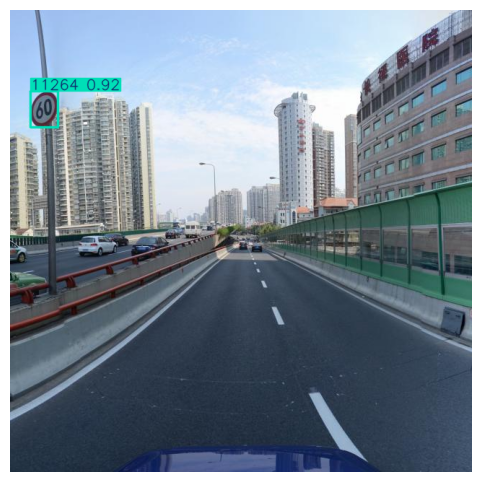

...

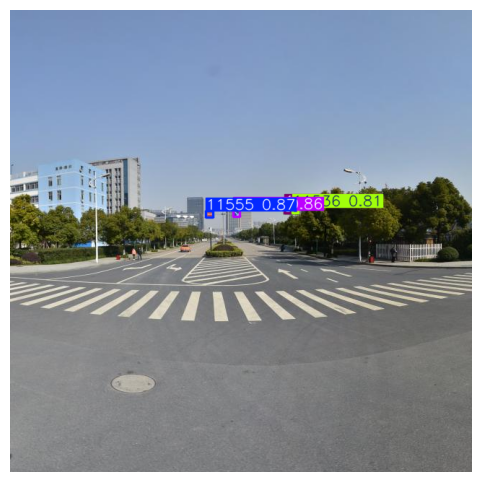

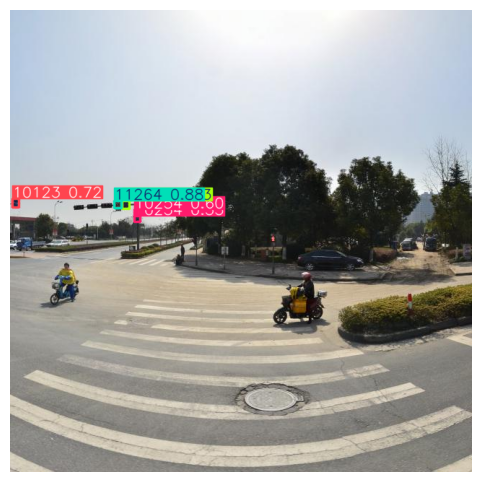

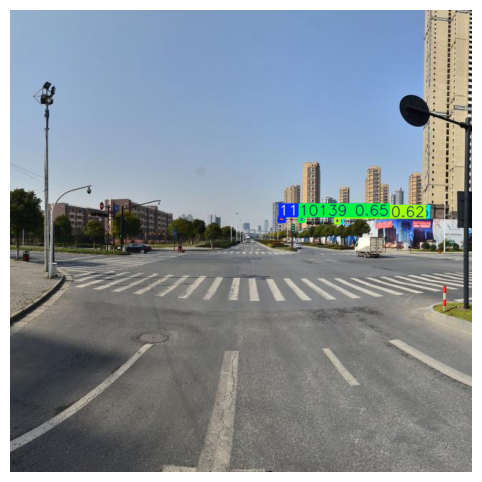

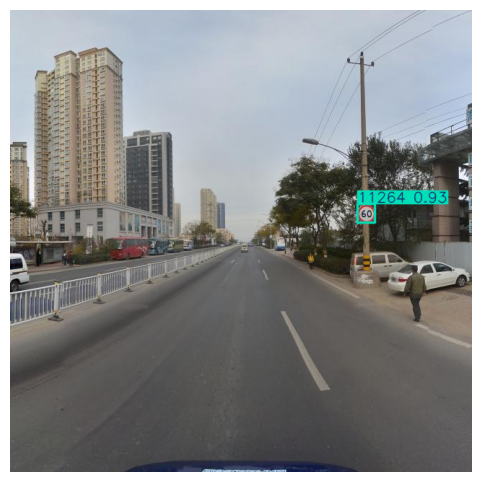

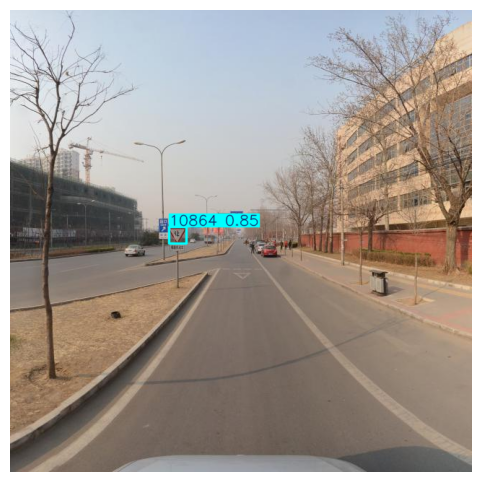

In [6]:
import glob
import cv2
import matplotlib.pyplot as plt

# Path to your test images
image_paths = glob.glob("/kaggle/input/test-images/test_images")  # Update with your folder path

# Run inference and visualize results
for img_path in image_paths:
    results = model(img_path)  # Perform object detection

    # Display results with bounding boxes
    for result in results:
        img = result.plot()  # This method plots bounding boxes on the image
        
        # Convert BGR (OpenCV) to RGB (Matplotlib)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # Show the image
        plt.figure(figsize=(8, 6))
        plt.imshow(img_rgb)
        plt.axis("off")  # Hide axes
        plt.show()



image 1/30 /kaggle/input/test-images-v2/test_images_v2/93077_jpg.rf.87665ec81b1180d17b4cbde8ffd4b66e.jpg: 640x640 1 10141, 1 11536, 37.7ms
image 2/30 /kaggle/input/test-images-v2/test_images_v2/93806_jpg.rf.b2d720fd366939b3da1f18b98ce60407.jpg: 640x640 1 10313, 1 1125, 1 11536, 37.4ms
image 3/30 /kaggle/input/test-images-v2/test_images_v2/94187_jpg.rf.228de6b0ef4f1414cb025e8172ed40c6.jpg: 640x640 1 10141, 1 10329, 1 10720, 37.4ms
image 4/30 /kaggle/input/test-images-v2/test_images_v2/94244_jpg.rf.3d2a8960dc8e78ed9e47ec2dc9585ddf.jpg: 640x640 (no detections), 36.5ms
image 5/30 /kaggle/input/test-images-v2/test_images_v2/94537_jpg.rf.c3ec6072d572d8eb0aa9193ddbe05213.jpg: 640x640 1 11536, 1 11555, 23.6ms
image 6/30 /kaggle/input/test-images-v2/test_images_v2/94629_jpg.rf.8bf9b10a077b9bc7c934fc35c0a71b08.jpg: 640x640 1 10480, 23.5ms
image 7/30 /kaggle/input/test-images-v2/test_images_v2/94771_jpg.rf.acbe83b68a4b93e48cf8ef4e94c6eb00.jpg: 640x640 1 11237, 1 11241, 23.3ms
image 8/30 /kaggle/

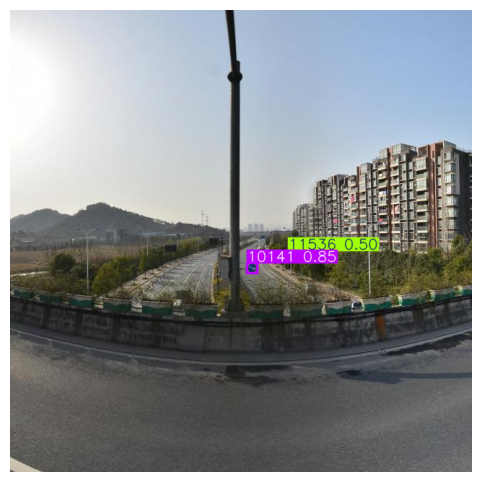

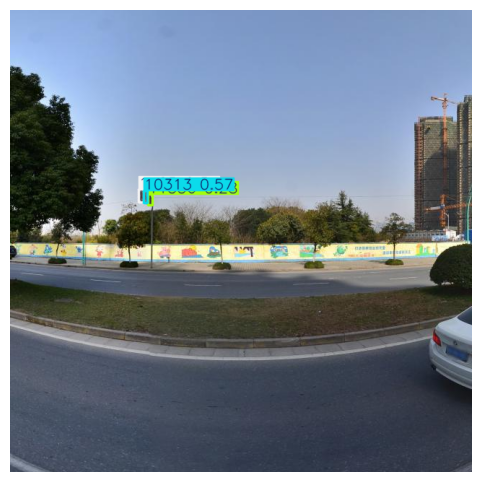

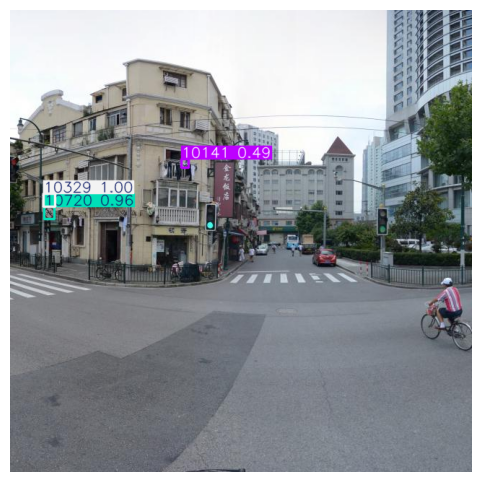

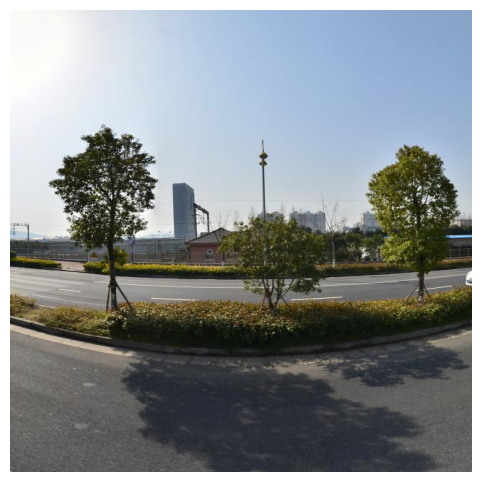

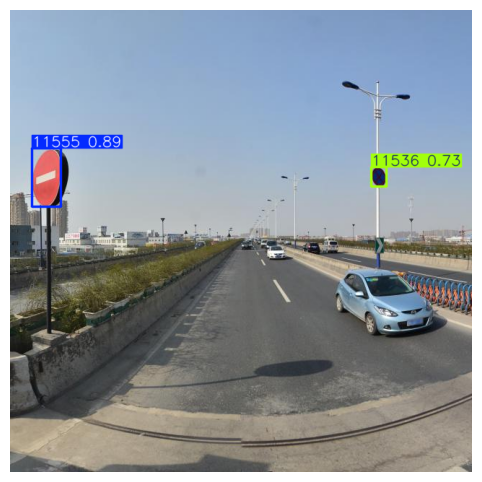

...

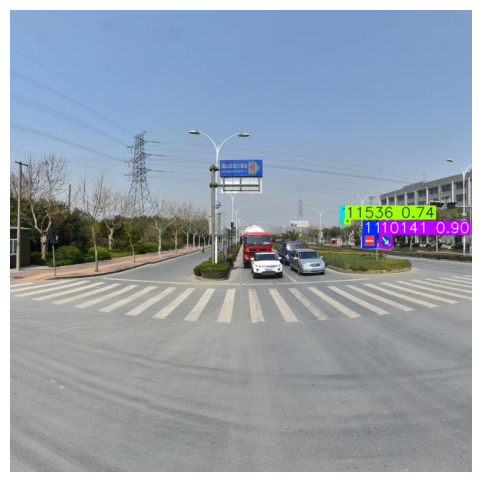

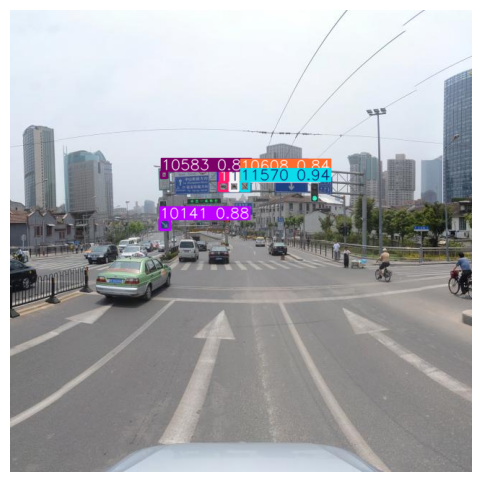

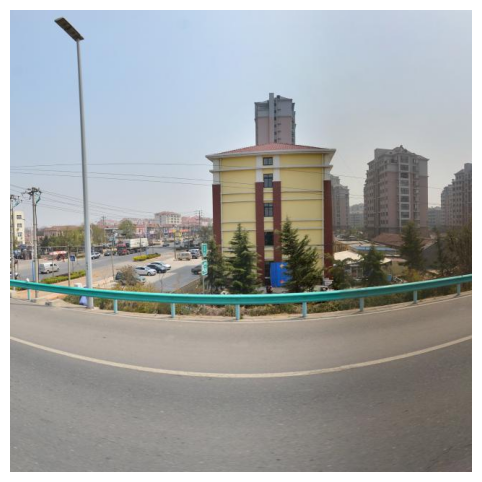

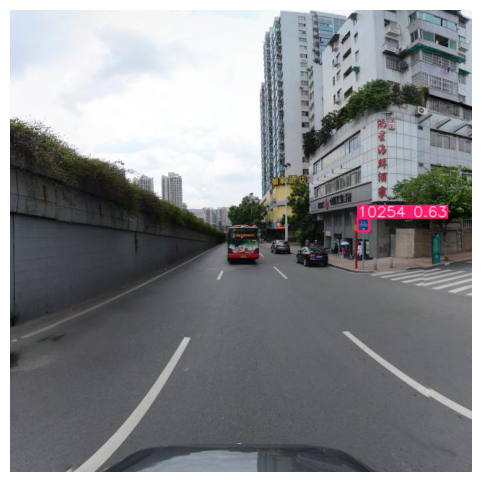

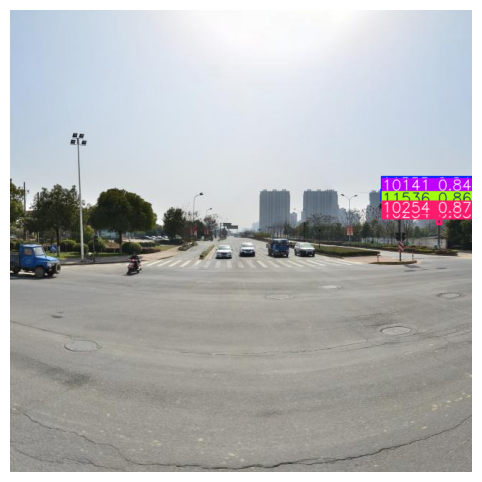

In [7]:
# Path to your test images
image_paths = glob.glob("/kaggle/input/test-images-v2/test_images_v2")  # Update with your folder path

# Run inference and visualize results
for img_path in image_paths:
    results = model(img_path)  # Perform object detection

    # Display results with bounding boxes
    for result in results:
        img = result.plot()  # This method plots bounding boxes on the image
        
        # Convert BGR (OpenCV) to RGB (Matplotlib)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # Show the image
        plt.figure(figsize=(8, 6))
        plt.imshow(img_rgb)
        plt.axis("off")  # Hide axes
        plt.show()
